In [1]:
import tensorflow as tf
from tensorflow.keras.layers import Resizing, Rescaling , RandomFlip, RandomRotation
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dropout, Input
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten , Dense
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical, plot_model
import numpy as np

2025-11-23 05:19:08.454978: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1763875148.477986    1832 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1763875148.485046    1832 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

In [2]:
IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3
EPOCHS = 50

In [3]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "/kaggle/input/plant-village/PlantVillage",
    shuffle = True,
    image_size = (IMAGE_SIZE,IMAGE_SIZE),
    batch_size = BATCH_SIZE,
    class_names = ["Potato___Early_blight","Potato___Late_blight","Potato___healthy"]
)

Found 2152 files belonging to 3 classes.


I0000 00:00:1763875155.543244    1832 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


In [4]:
print(len(dataset))

68


In [5]:
class_names = dataset.class_names
print(class_names)

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']


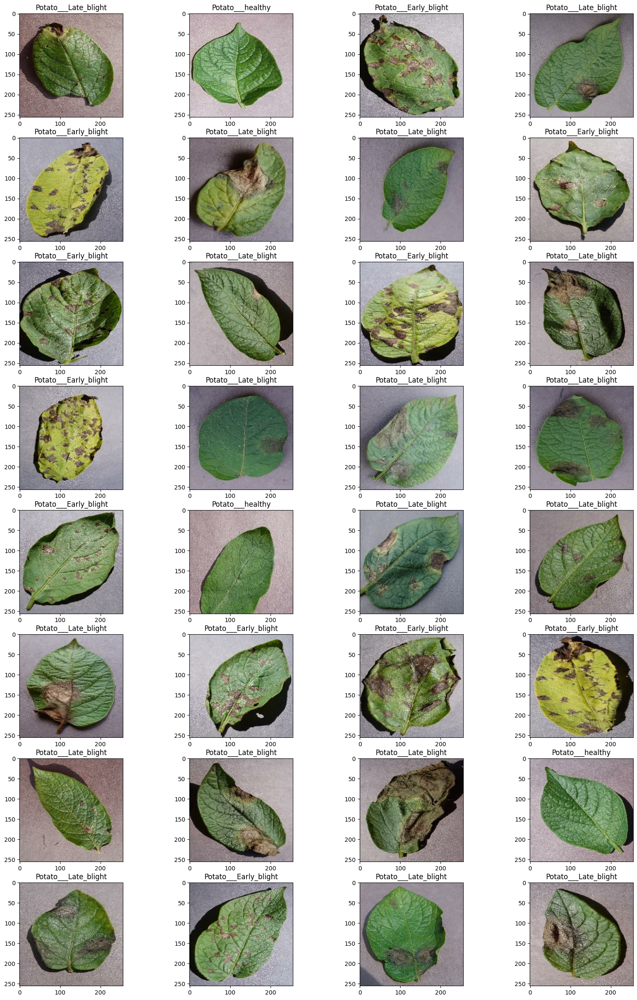

In [6]:
plt.figure(figsize=(20,30))
for image_batch , label_batch in dataset.take(1):
    for i in range(32):
        plt.subplot(8,4,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[label_batch[i]])

In [7]:
def get_dataset_partitions_tf(ds,train_split = 0.8 , val_split = 0.1, test_split = 0.1 , shuffle = True , shuffle_size = 10000):
    ds_size = len(ds)

    if shuffle:
        ds = ds.shuffle(shuffle_size,seed=12)
        
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)
    val_ds= ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    return train_ds,val_ds,test_ds

In [8]:
train_ds,val_ds,test_ds = get_dataset_partitions_tf(dataset)

In [9]:
print(len(train_ds),len(val_ds),len(test_ds))

54 6 8


In [10]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)

In [11]:
resize_and_rescale = tf.keras.Sequential([
    Resizing(IMAGE_SIZE, IMAGE_SIZE),
    Rescaling(1.0/255)
])


In [12]:
data_augmentation = tf.keras.Sequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2)
])

In [13]:
input_shape = (IMAGE_SIZE,IMAGE_SIZE)
n_classes = 3
model = Sequential()
model.add(Resizing(IMAGE_SIZE, IMAGE_SIZE, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)))
model.add(Rescaling(1/255))
model.add(data_augmentation)
model.add(Conv2D(32,3,activation='relu'))
model.add(MaxPooling2D(2))
model.add(Conv2D(64,3,activation='relu'))
model.add(MaxPooling2D(2))
model.add(Conv2D(64,3,activation='relu'))
model.add(MaxPooling2D(2))
model.add(Conv2D(64,3,activation='relu'))
model.add(MaxPooling2D(2))
model.add(Conv2D(64,3,activation='relu'))
model.add(MaxPooling2D(2))
model.add(Conv2D(64,3,activation='relu'))
model.add(MaxPooling2D(2))
model.add(Flatten())
model.add(Dense(64,activation='relu'))
model.add(Dense(n_classes,activation = 'softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_1 (Resizing)           │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_1 (Sequential)       │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 4, 4, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 2, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 183,747 (717.76 KB)

 Trainable params: 183,747 (717.76 KB)

 Non-trainable params: 0 (0.00 B)

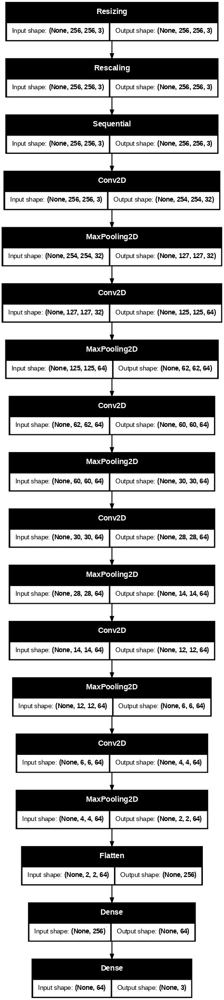

In [14]:
model.summary()
plot_model(model,dpi = 70, show_shapes=True)

In [15]:
model.compile(
    optimizer = 'adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [16]:
history = model.fit(
    train_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    verbose=1,
    validation_data = val_ds
)

Epoch 1/50


I0000 00:00:1763875168.532511    1886 cuda_dnn.cc:529] Loaded cuDNN version 90300


54/54 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - accuracy: 0.4678 - loss: 0.9319 - val_accuracy: 0.4948 - val_loss: 0.8580
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.5318 - loss: 0.8450 - val_accuracy: 0.6823 - val_loss: 0.8030
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.7871 - loss: 0.5331 - val_accuracy: 0.8125 - val_loss: 0.5589
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.8239 - loss: 0.4301 - val_accuracy: 0.8594 - val_loss: 0.4627
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.8776 - loss: 0.3338 - val_accuracy: 0.9010 - val_loss: 0.2328
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.8857 - loss: 0.2717 - val_accuracy: 0.9531 - val_loss: 0.1513
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.8912 - loss: 0.2630 - val_accuracy: 0.9583 - val_loss: 0.1355
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.9352 - loss: 0.1842 - val_accuracy: 0.9479 - val_loss: 0

In [17]:
scores = model.evaluate(test_ds)

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.8816 - loss: 0.4983


In [18]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

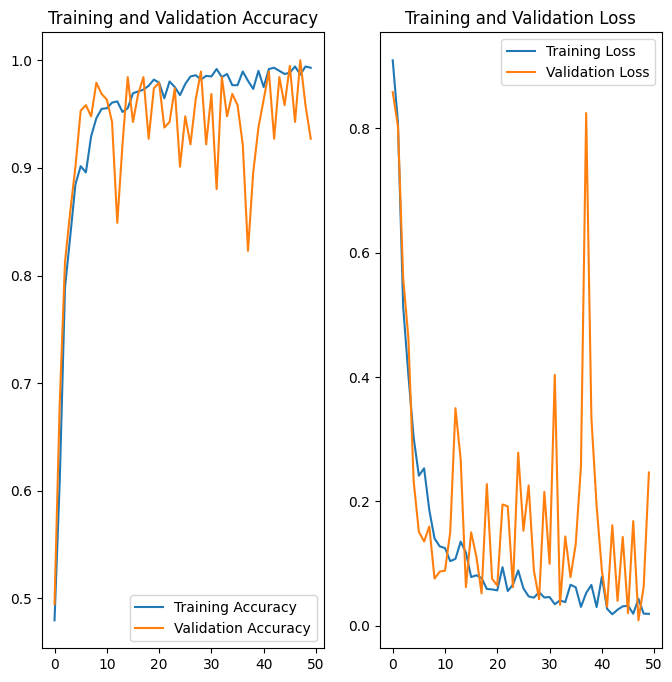

In [19]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS),acc,label="Training Accuracy")
plt.plot(range(EPOCHS),val_acc,label="Validation Accuracy")
plt.legend(loc = 'lower right')
plt.title("Training and Validation Accuracy")

plt.subplot(1,2,2)
plt.plot(range(EPOCHS),loss,label="Training Loss")
plt.plot(range(EPOCHS),val_loss,label="Validation Loss")
plt.legend(loc = 'upper right')
plt.title("Training and Validation Loss")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


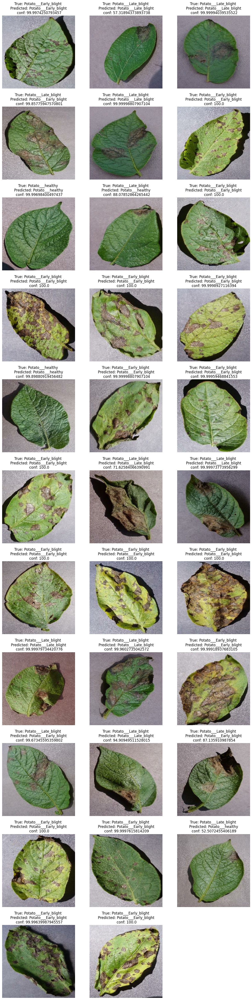

In [20]:
plt.figure(figsize=(15,60))
for image_batch , label_batch in test_ds.take(1):
    batch_prediction = model.predict(image_batch)
    for i in range(32):
        plt.subplot(11,3,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        true_label = class_names[label_batch[i]]
        confidence = 100 * batch_prediction[i][np.argmax(batch_prediction[i])]
        pred_label = class_names[np.argmax(batch_prediction[i])]

        plt.title(f"True: {true_label} \n Predicted: {pred_label} \n conf: {confidence}")
        plt.axis('off')



In [22]:
model.save('/kaggle/working/model.keras')
model.save('/kaggle/working/model.h5')
model.export('/kaggle/working/model_exported')


INFO:tensorflow:Assets written to: /kaggle/working/model_exported/assets


INFO:tensorflow:Assets written to: /kaggle/working/model_exported/assets


Saved artifact at '/kaggle/working/model_exported'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 3), dtype=tf.float32, name=None)
Captures:
  133297748370320: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133299952453968: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133297810977232: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133296224249104: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133296224251984: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133297810976464: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133297810976848: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133297810976656: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133296091791440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133296091793360: TensorSpec(shape=(), dtype=tf.resource, name=None)
  

In [26]:
!zip -r /kaggle/working/model_exported.zip /kaggle/working/model_exported


  adding: kaggle/working/model_exported/ (stored 0%)
  adding: kaggle/working/model_exported/variables/ (stored 0%)
  adding: kaggle/working/model_exported/variables/variables.index (deflated 69%)
  adding: kaggle/working/model_exported/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: kaggle/working/model_exported/assets/ (stored 0%)
  adding: kaggle/working/model_exported/fingerprint.pb (stored 0%)
  adding: kaggle/working/model_exported/saved_model.pb (deflated 88%)
